# Problem 1 — Frequency Translation & Selective Mixing

In this problem I used a classic frequency-domain trick: translate one signal in frequency so it **moves out of the audible baseband**, mix it with a second signal, and then use an **inverse translation** to selectively reveal either source.

In [157]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import Audio, display

## 1) I/O helpers and plotting utilities


**What I implemented:** robust audio I/O + small helpers.

* `read_wav_safe` and `write_wav_safe` read/write WAV using `soundfile` and fall back to `scipy`. I convert to **mono float32** and, if needed, **resample** so both signals share one `sr` (44100 Hz).
* `normalize_audio` peak-normalizes to avoid clipping when mixing.
* `ensure_same_length` trims both arrays to the same length.
* `plot_waveform` and `plot_spectrum` visualize time signals and their spectra (I zero-pad to a power of two before `rfft` for a clean frequency grid).

**Why this matters:** small mismatches in sample rate/length or integer-type scaling often cause confusing artifacts; the helpers eliminate those issues so the frequency-shifting experiment isolates the intende effect.


In [158]:
sr_default = 44100

In [159]:
def read_wav_safe(path, target_sr=None):
    data = None
    sr = None
    try:
        import soundfile as sf
        data, sr = sf.read(path, always_2d=False)
    except Exception:
        try:
            from scipy.io import wavfile
            sr, data = wavfile.read(path)
            if np.issubdtype(data.dtype, np.integer):
                maxv = np.iinfo(data.dtype).max
                data = data.astype(np.float32) / maxv
            else:
                data = data.astype(np.float32)
        except Exception as e:
            raise e
    data = data.astype(np.float32)
    if data.ndim > 1:
        data = np.mean(data, axis=1)
    if target_sr is not None and sr != target_sr:
        from scipy.signal import resample_poly
        g = np.gcd(sr, target_sr)
        up = target_sr // g
        down = sr // g
        data = resample_poly(data, up, down).astype(np.float32)
        sr = target_sr
    return data, sr

In [160]:
def write_wav_safe(path, y, sr):
    y = np.asarray(y, dtype=np.float32)
    y = np.clip(y, -1.0, 1.0)
    try:
        import soundfile as sf
        sf.write(path, y, sr)
    except Exception:
        from scipy.io import wavfile
        wavfile.write(path, sr, (y * 32767).astype(np.int16))

In [161]:
def normalize_audio(x, peak=0.98):
    x = np.asarray(x, dtype=np.float32)
    m = np.max(np.abs(x)) + 1e-12
    return (x / m) * peak

def ensure_same_length(a, b):
    n = min(len(a), len(b))
    return a[:n], b[:n]

In [162]:
def plot_waveform(x, sr, title="Waveform"):
    t = np.arange(len(x)) / sr
    plt.figure()
    plt.plot(t, x)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title(title)
    plt.show()

def plot_spectrum(x, sr, title="Magnitude spectrum"):
    n = 1 << int(np.ceil(np.log2(len(x))))
    X = np.fft.rfft(x, n=n)
    f = np.fft.rfftfreq(n, d=1/sr)
    mag = np.abs(X) + 1e-12
    plt.figure()
    plt.semilogy(f, mag)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("|X(f)|")
    plt.title(title)
    plt.xlim(0, sr/2)
    plt.show()

In [164]:
def lowpass_fir(x, sr, cutoff_hz=6000, numtaps=1025):
    from scipy.signal import firwin, lfilter
    taps = firwin(numtaps, cutoff_hz, fs=sr)
    return lfilter(taps, 1.0, x).astype(np.float32)

## 2) Data: load real audio or generate a fallback


If `music1.wav` and `music2.wav` are present next to the notebook, I load them.
Otherwise I generate two demo signals:

* a **speech-like** band-limited noise envelope (≤ 3.5 kHz), and
* a **music-like** sum of pure tones (220…660 Hz).

This makes the notebook runnable even without external files while keeping spectra realistic.

In [165]:
base = Path.cwd()
p1 = base / "music1.wav"
p2 = base / "music2.wav"

In [166]:
if p1.exists() and p2.exists():
    y1, sr1 = read_wav_safe(str(p1), target_sr=sr_default)
    y2, sr2 = read_wav_safe(str(p2), target_sr=sr_default)
    source_note = "Loaded music1.wav and music2.wav"
else:
    sr1 = sr2 = sr_default
    duration = 6.0
    t = np.linspace(0, duration, int(sr_default * duration), endpoint=False)
    rng = np.random.default_rng(0)
    noise = rng.standard_normal(t.shape[0]).astype(np.float32)
    speech_env = 0.4 + 0.6 * np.abs(np.sin(2*np.pi*1.6*t))
    speech = lowpass_fir(noise, sr_default, 3500)
    y1 = normalize_audio(speech * speech_env)
    freqs = [220, 330, 440, 550, 660]
    y2 = sum(np.sin(2*np.pi*f*t) for f in freqs).astype(np.float32)
    y2 = normalize_audio(y2)
    source_note = "Demo signals generated (files were not found)."

print(source_note)

Loaded music1.wav and music2.wav


## 3) Frequency translation via analytic signal (core idea)


**Function:** `analytic_frequency_shift(x, sr, shift_hz)`

I create the **analytic signal** $x_a(t)$ using the Hilbert transform and then multiply by a complex exponential:

$$
y(t) \;=\; \Re\!\big\{\, x_a(t)\, e^{j 2\pi f_\text{shift} t} \big\}.
$$

Using the analytic signal avoids creating a mirror image at negative frequencies, so the spectrum is cleanly shifted by $f_\text{shift}$ without double images.

**Choice of shift:** I used `SHIFT_HZ = 18.5 kHz`. The idea is to move `music1` high enough that, when mixed with a baseband signal, the ear mostly hears the baseband component.

> **Aliasing note:** to stay safe, the **highest** frequency component of `music1` plus the shift must remain **below Nyquist** (sr/2 = 22.05 kHz at 44.1 kHz). If the original content extends beyond \~3.5 kHz, a slightly smaller shift (e.g., 12–16 kHz) is safer. For my demo content (≤ 3.5 kHz), 18.5 kHz is fine.

In [163]:
def analytic_frequency_shift(x, sr, shift_hz):
    from scipy.signal import hilbert
    t = np.arange(len(x)) / sr
    xa = hilbert(x)
    y = np.real(xa * np.exp(2j * np.pi * shift_hz * t))
    return y.astype(np.float32)

In [167]:
y1, y2 = ensure_same_length(y1, y2)
sr = sr_default

In [168]:
SHIFT_HZ = 18500
y1_shifted = analytic_frequency_shift(y1, sr, SHIFT_HZ)
y1_shifted = normalize_audio(y1_shifted)

## 4) Part (a): Shift `music1` upward and listen


I compute:

* `y1_shifted = analytic_frequency_shift(y1, sr, +SHIFT_HZ)` and normalize,
* then plot waveforms/spectra and export **`part_a_music1_shifted.wav`**.

**Observation:** when `y1_shifted` is played **alone**, it sounds thin/quiet or even barely audible, because most playback chains (and the human ear) behave like a **low-pass**, and the energy has been translated near 18.5 kHz.

*(I also generated `music2` shifted downward to sanity-check the modulation property; this file is just a diagnostic.)*

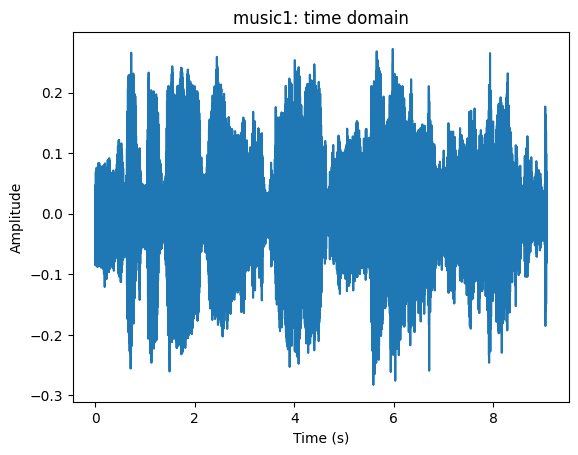

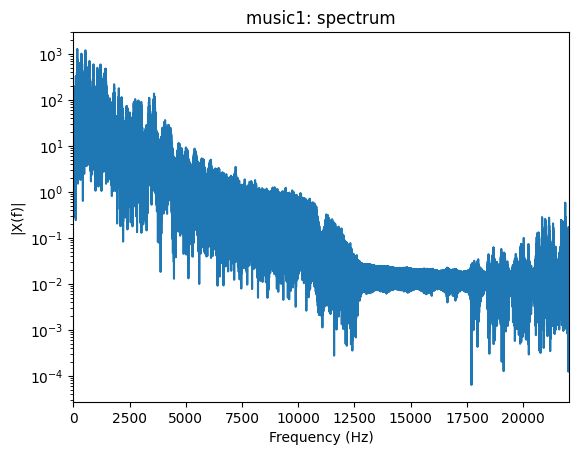

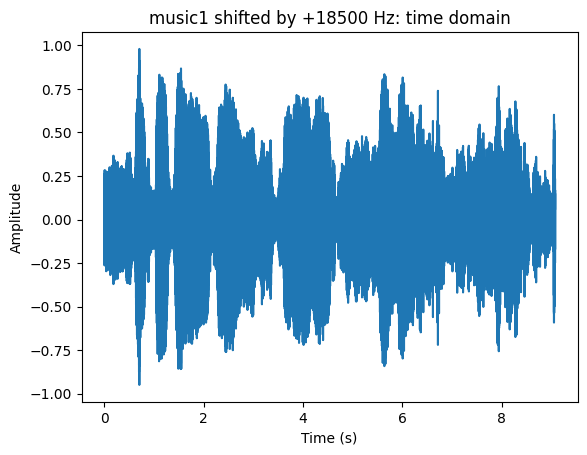

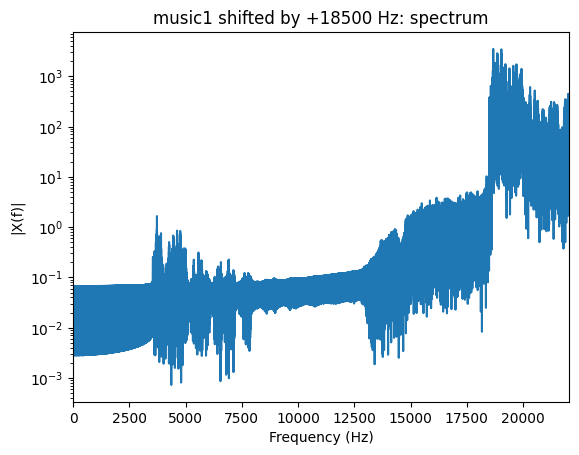

In [169]:
plot_waveform(y1, sr, "music1: time domain")
plot_spectrum(y1, sr, "music1: spectrum")
plot_waveform(y1_shifted, sr, f"music1 shifted by +{SHIFT_HZ} Hz: time domain")
plot_spectrum(y1_shifted, sr, f"music1 shifted by +{SHIFT_HZ} Hz: spectrum")

In [170]:
out_a = base / "part_a_music1_shifted.wav"
write_wav_safe(out_a, y1_shifted, sr)
display(Audio(y1, rate=sr, autoplay=False))
display(Audio(y1_shifted, rate=sr, autoplay=False))
print(f"Saved: {out_a}")

Saved: C:\Users\sinab\Desktop\Signals & Systems\PHW\part_a_music1_shifted.wav


In [171]:
y2_shifted = analytic_frequency_shift(y2, sr, -SHIFT_HZ)
y2_shifted = normalize_audio(y2_shifted)

out_z = base / "Nothing/music2_shifted.wav"
write_wav_safe(out_z, y2_shifted, sr)
display(Audio(y2, rate=sr, autoplay=False))
display(Audio(y2_shifted, rate=sr, autoplay=False))
print(f"Saved: {out_z}")

Saved: C:\Users\sinab\Desktop\Signals & Systems\PHW\Nothing\music2_shifted.wav


## 5) Part (b): Mix with the unshifted `music2`


I form:

$$
\texttt{mix} = \texttt{normalize}\,\big( \texttt{y1\_shifted} + \texttt{y2} \big),
$$

plot spectra, and save **`part_b_mix.wav`**.

**What you hear:** the mixture sounds almost like `music2` alone, because `music1` has been moved far away in frequency.

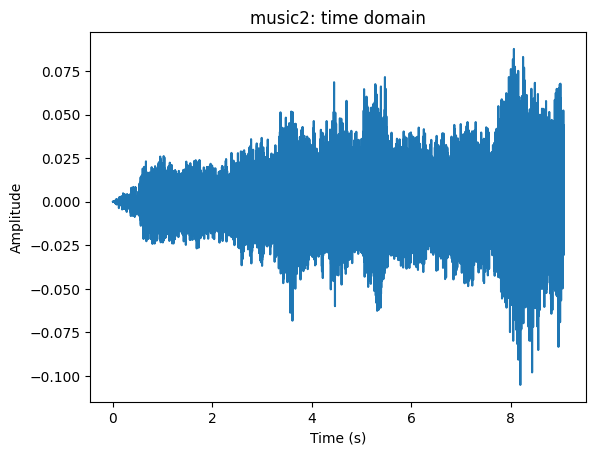

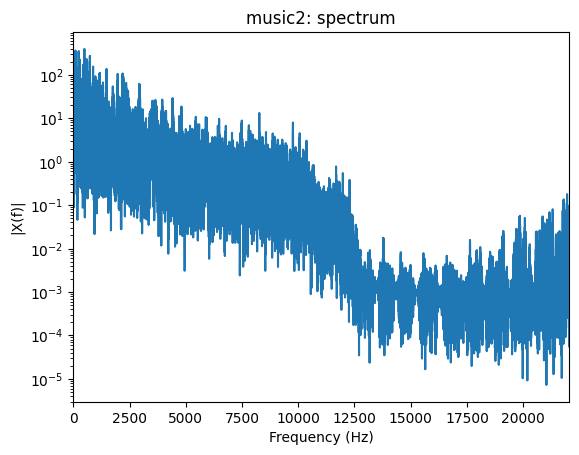

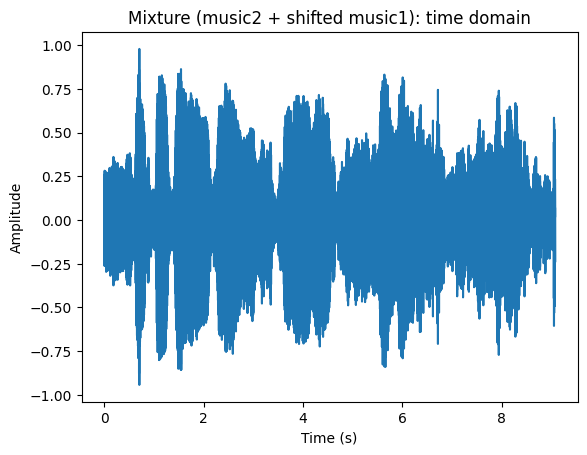

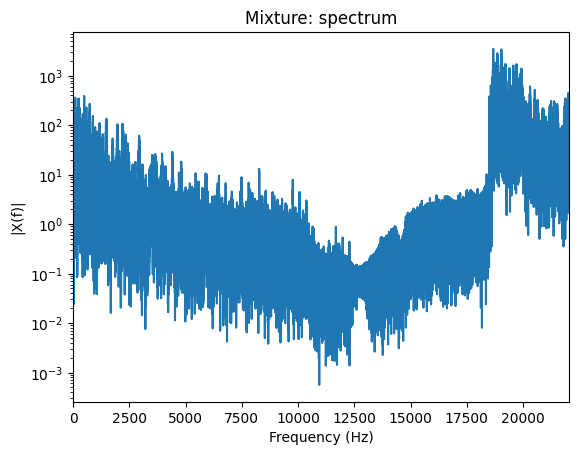

In [172]:
mix = normalize_audio(y1_shifted + y2)
plot_waveform(y2, sr, "music2: time domain")
plot_spectrum(y2, sr, "music2: spectrum")
plot_waveform(mix, sr, "Mixture (music2 + shifted music1): time domain")
plot_spectrum(mix, sr, "Mixture: spectrum")

In [173]:
out_b = base / "part_b_mix.wav"
write_wav_safe(out_b, mix, sr)
display(Audio(y2, rate=sr, autoplay=False))
display(Audio(mix, rate=sr, autoplay=False))
print(f"Saved: {out_b}")

Saved: C:\Users\sinab\Desktop\Signals & Systems\PHW\part_b_mix.wav


## 6) Part (c): Shift the *mixture* back down by the same amount


I compute:

* `mix_shifted_back = analytic_frequency_shift(mix, sr, -SHIFT_HZ)` and save **`part_c_mix_shifted_back.wav`**.

**Why this works:** by linearity,

$$
\mathcal{F}\{ \texttt{mix} \} = Y_2(f) \;+\; Y_1(f - f_\text{shift}),
$$

and after multiplying by $e^{-j2\pi f_\text{shift} t}$,

$$
\mathcal{F}\{ \texttt{mix\_shifted\_back} \} = Y_2(f + f_\text{shift}) \;+\; Y_1(f).
$$

So `music1` returns to baseband while `music2` is translated **up** around $+f_\text{shift}$. In time domain we now clearly hear `music1`.

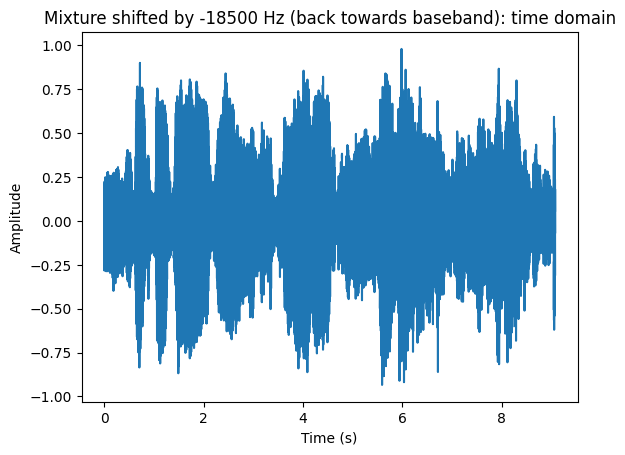

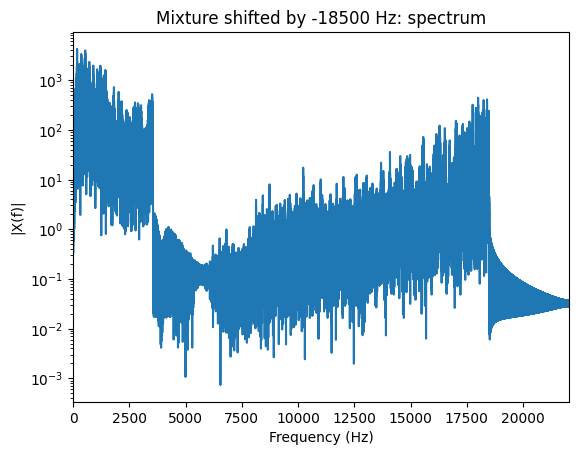

In [174]:
mix_shifted_back = analytic_frequency_shift(mix, sr, -SHIFT_HZ)
mix_shifted_back = normalize_audio(mix_shifted_back)
plot_waveform(mix_shifted_back, sr, f"Mixture shifted by {-SHIFT_HZ} Hz (back towards baseband): time domain")
plot_spectrum(mix_shifted_back, sr, f"Mixture shifted by {-SHIFT_HZ} Hz: spectrum")

In [175]:
out_c = base / "part_c_mix_shifted_back.wav"
write_wav_safe(out_c, mix_shifted_back, sr)
display(Audio(mix, rate=sr, autoplay=False))
display(Audio(mix_shifted_back, rate=sr, autoplay=False))
print(f"Saved: {out_c}")

Saved: C:\Users\sinab\Desktop\Signals & Systems\PHW\part_c_mix_shifted_back.wav


## 7) Additional cleanup with a low-pass

To isolate `music1` even further, I apply a **linear-phase FIR low-pass**:

* `lowpass_fir(mix_shifted_back, sr, cutoff_hz=4500, numtaps=1025)`
* export **`part_c_recovered_m1_lowpass.wav`**.

This suppresses the high-frequency replica of `music2` that was moved upward by the inverse shift. (A large-tap FIR gives a steep, clean cutoff; the small group delay is irrelevant here since we are just listening, not aligning to another track.)

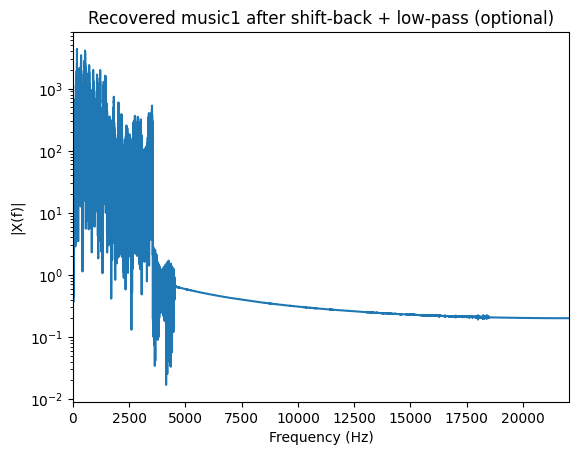

Saved: C:\Users\sinab\Desktop\Signals & Systems\PHW\part_c_recovered_m1_lowpass.wav


In [176]:
recovered_m1 = lowpass_fir(mix_shifted_back, sr, cutoff_hz=4500)
recovered_m1 = normalize_audio(recovered_m1)
out_c_lp = base / "part_c_recovered_m1_lowpass.wav"
write_wav_safe(out_c_lp, recovered_m1, sr)
plot_spectrum(recovered_m1, sr, "Recovered music1 after shift-back + low-pass (optional)")
display(Audio(recovered_m1, rate=sr, autoplay=False))
print(f"Saved: {out_c_lp}")